In [3]:
import json
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors

In [4]:
PATH = "../../../"

In [5]:
categories = [
    {"id": 0, "name": "bird"},
    {"id": 1, "name": "actitis hypoleucos"},
    {"id": 2, "name": "anthus pratensis"},
    {"id": 3, "name": "calandrella brachydactyla"},
    {"id": 4, "name": "carduelis carduelis"},
    {"id": 5, "name": "cettia cetti"},
    {"id": 6, "name": "chloris chloris"},
    {"id": 7, "name": "ciconia ciconia"},
    {"id": 8, "name": "cisticola juncidis"},
    {"id": 9, "name": "curruca"},
    {"id": 10, "name": "emberiza calandra"},
    {"id": 11, "name": "erithacus rubecula"},
    {"id": 12, "name": "fringilla"},
    {"id": 13, "name": "galerida"},
    {"id": 14, "name": "lanius"},
    {"id": 15, "name": "luscinia megarhynchos"},
    {"id": 16, "name": "merops apiaster"},
    {"id": 17, "name": "motacilla"},
    {"id": 18, "name": "parus major"},
    {"id": 19, "name": "passer"},
    {"id": 20, "name": "pica pica"},
    {"id": 21, "name": "saxicola rubicola"},
    {"id": 22, "name": "serinus serinus"},
    {"id": 23, "name": "streptopelia decaocto"},
    {"id": 24, "name": "sturnus"},
    {"id": 25, "name": "turdus merula"},
]

In [7]:
# Cargar el archivo JSON de predicciones
with open('../runs/detect/val7/predictions.json', 'r') as json_file:
    predictions = json.load(json_file)

# Cargar el archivo de rutas de imágenes
with open(PATH + 'desarrollo/Data/Dataset/TXTs/test.txt', 'r') as txt_file:
    image_paths = txt_file.readlines()
    image_paths = [path.strip() for path in image_paths]

In [8]:
def denormalize_bbox(bbox, image_width, image_height):
    x_center, y_center, width, height = bbox
    x_min = int((x_center - width / 2) * image_width)
    y_min = int((y_center - height / 2) * image_height)
    x_max = int((x_center + width / 2) * image_width)
    y_max = int((y_center + height / 2) * image_height)
    return x_min, y_min, x_max, y_max

In [67]:
def plot_image_and_bboxes(image_path):
    image_id = image_path.split('/')[-1].replace('.PNG', '')

    # Filtrar las predicciones para la imagen seleccionada y con score > THRESHOLD
    filtered_predictions = [pred for pred in predictions if pred['image_id'] == image_id]

    # Mostrar la imagen y sus bounding boxes
    fig, ax = plt.subplots(figsize=(10, 8))
    img = plt.imread("../" + image_path)
    ax.imshow(img)

    # Título de la imagen con el path completo
    plt.title(image_path, fontsize=12)

    # Create a dictionary to map labels to colors
    label_to_color = {}

    for pred in filtered_predictions:
        category_id = pred['category_id']
        label = categories[category_id]['name']
        bbox = pred['bbox']

        if label not in label_to_color:
            label_to_color[label] = list(mcolors.TABLEAU_COLORS.values())[len(label_to_color) % len(mcolors.TABLEAU_COLORS)]
        color = label_to_color[label]
        ax.fill_between([bbox[0], bbox[0] + bbox[2]], bbox[1], bbox[1] + bbox[3], alpha=0.3, label=label, color=color, linewidth=3)

        # Add score of prediction above the bbox with a transparent background
        ax.text(bbox[0], bbox[1] - 5, f"{pred['score']:.2f}", fontsize=8, color='white', bbox=dict(facecolor=color, edgecolor=color, alpha=0.5, pad=0))

        # print(pred)

    # Turn Image path into GT label path and plot GT labels
    with open("../" + image_path.replace("images","labels").replace(".PNG",".txt"), 'r') as txt_file:
        gt_labels = txt_file.readlines()
        for gt_label in gt_labels:
            gt_label = gt_label.split(' ')
            label = "GT - "+ categories[int(gt_label[0])]['name']
            bbox = [float(gt_label[i]) for i in range(1, 5)]
            x_min, y_min, x_max, y_max = denormalize_bbox(bbox, img.shape[1], img.shape[0])
            if label not in label_to_color:
                label_to_color[label] = list(mcolors.TABLEAU_COLORS.values())[len(label_to_color) % len(mcolors.TABLEAU_COLORS)]
            color = label_to_color[label]
            ax.add_patch(patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor=color, facecolor='none', label=label))
    
    # Add count of classes between () in the legend
    handles, labels = ax.get_legend_handles_labels()
    label_count = {}
    for label in labels:
        if label not in label_count:
            label_count[label] = 0
        label_count[label] += 1
    for i, label in enumerate(labels):
        labels[i] = f"{label} (x{label_count[label]})"
    
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc="best")

    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

    # Show the plot
    plt.tight_layout()
    plt.show()

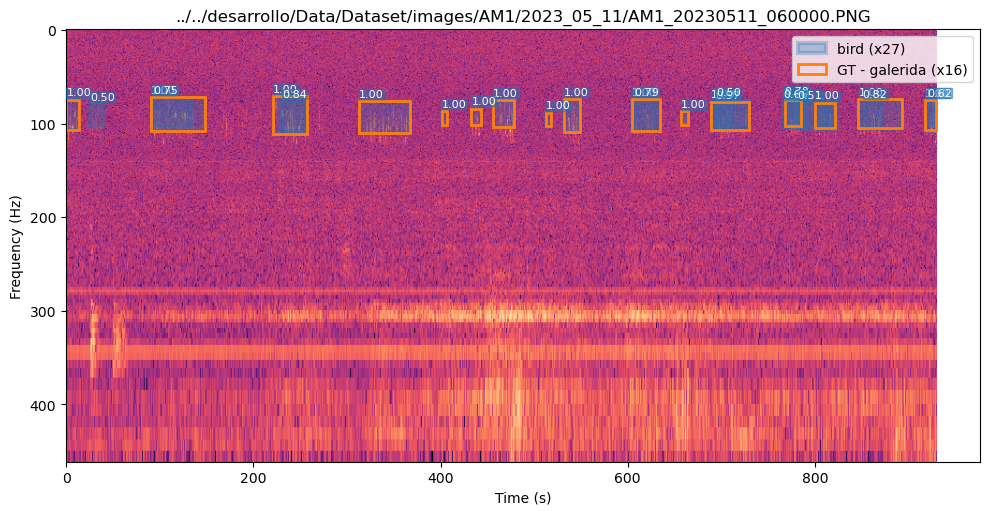

In [88]:
# Escoger una imagen aleatoria
random_image_path = random.choice(image_paths)
plot_image_and_bboxes(random_image_path)

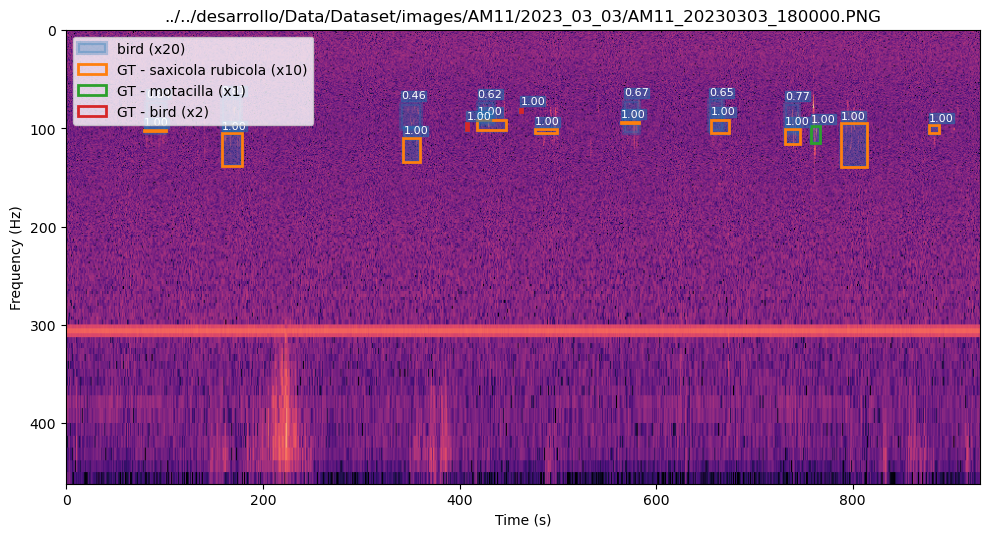

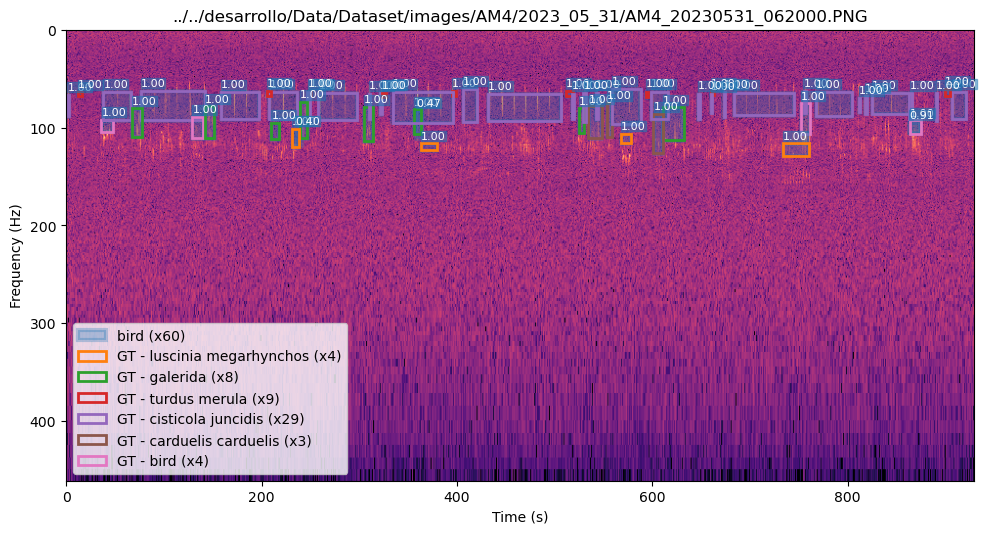

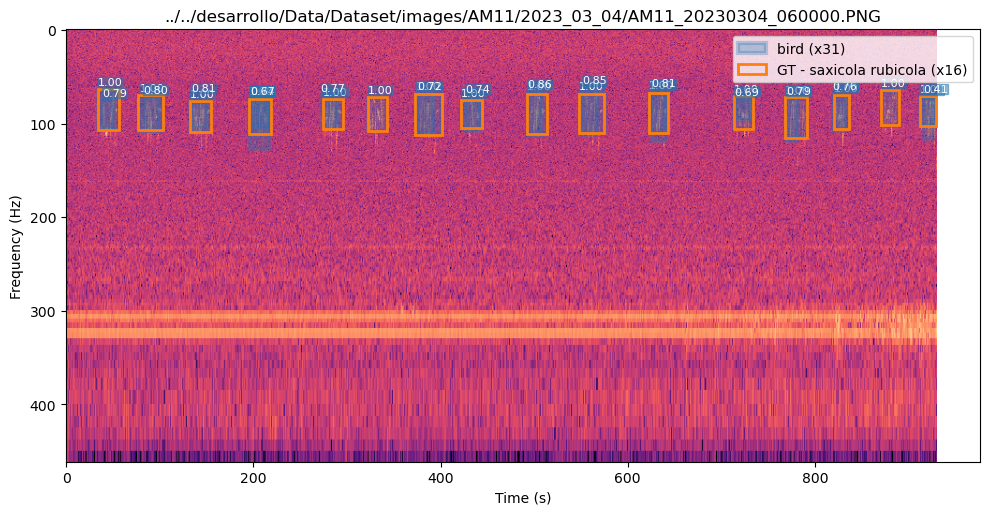

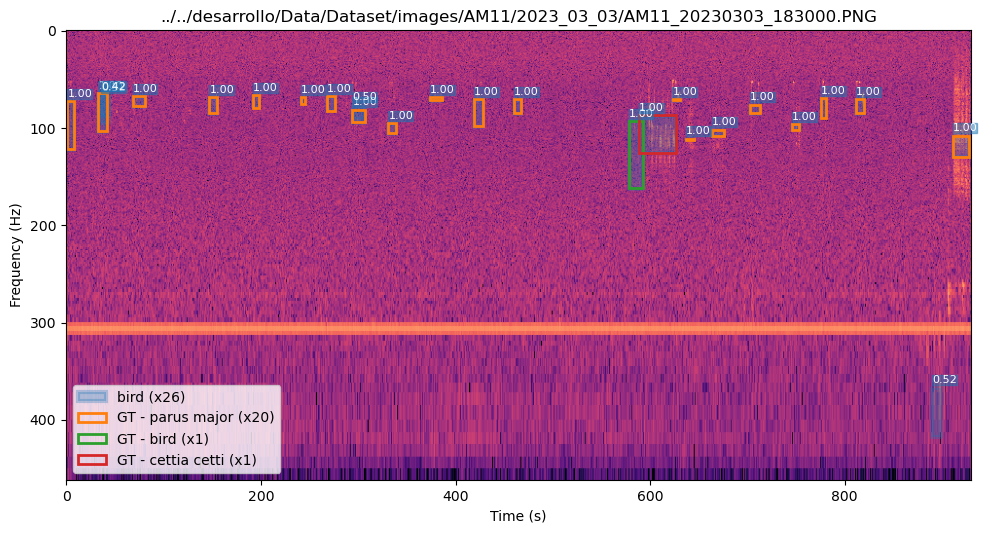

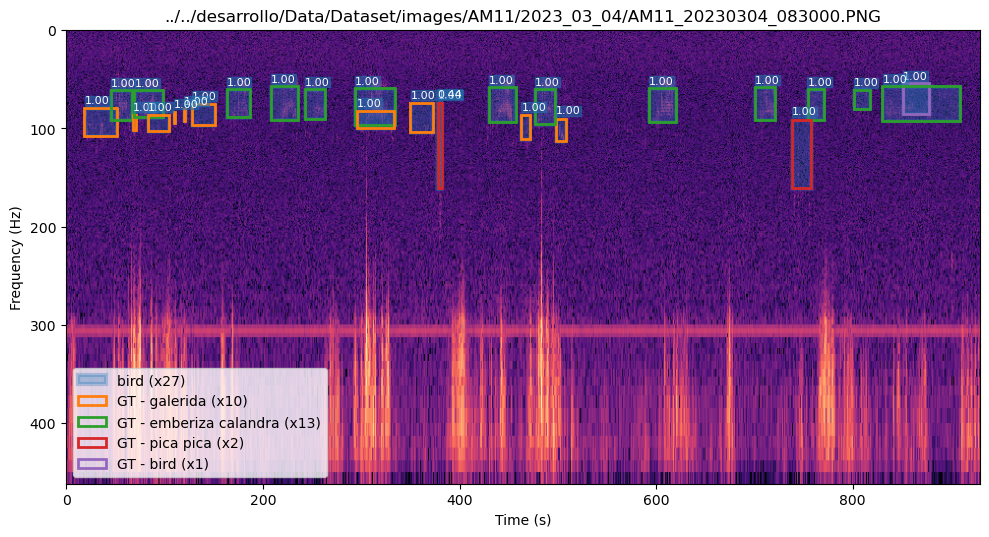

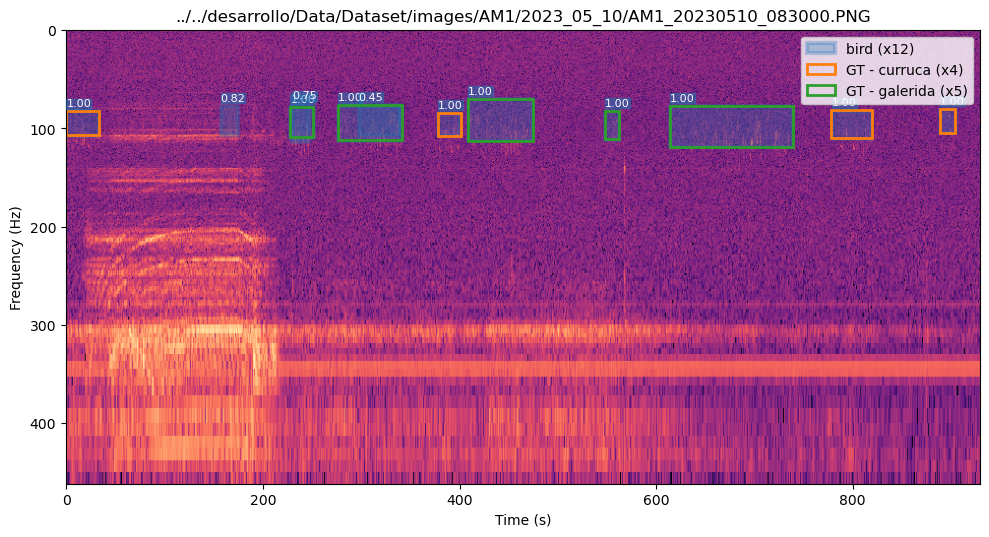

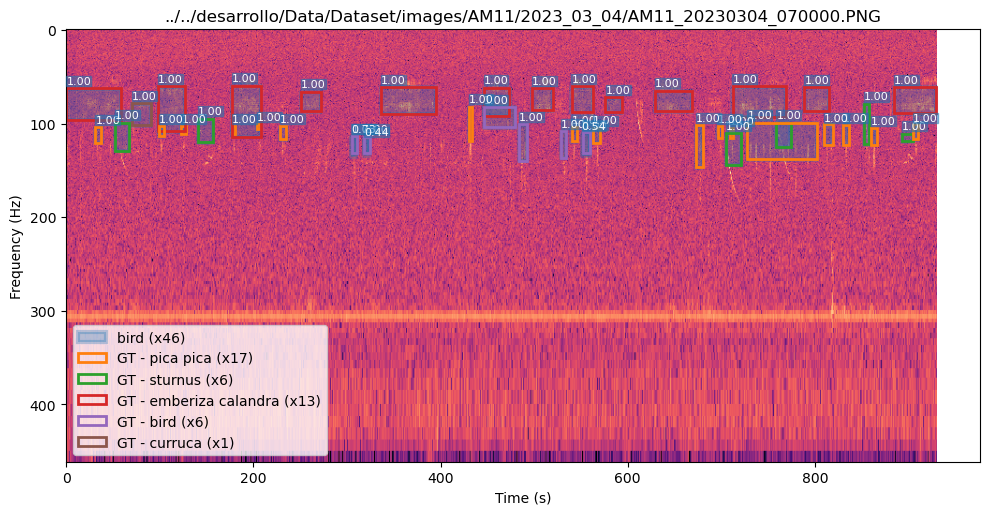

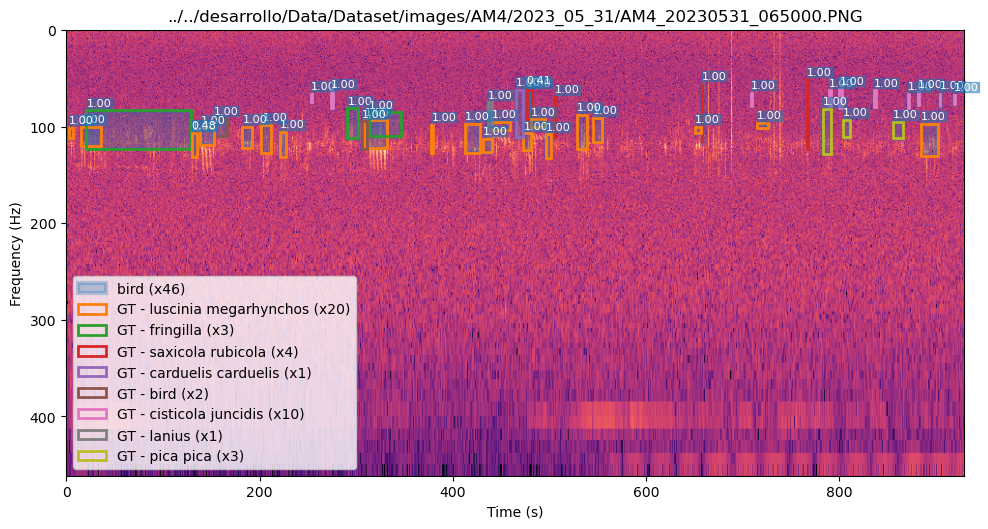

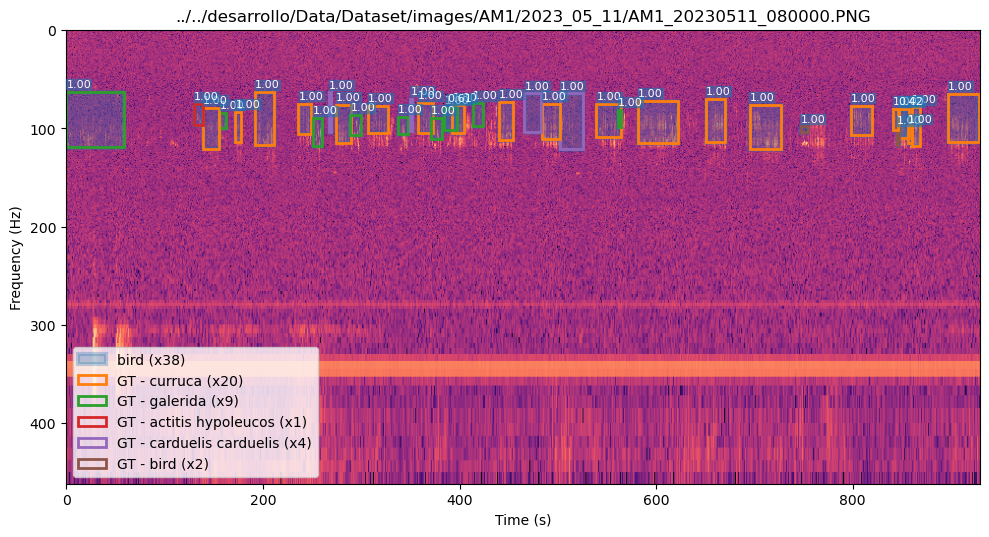

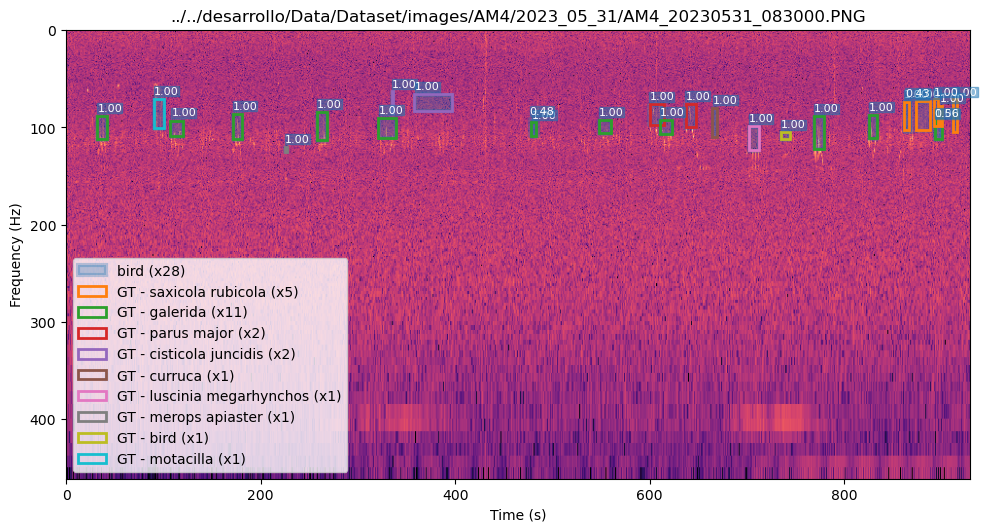

In [70]:
# Look for the 10 worst predictions and plot the unique images
worst_predictions = sorted(predictions, key=lambda x: x['score'])[:10]
worst_images = list(set([pred['image_id'] for pred in worst_predictions]))
for image_path in worst_images:
    # Look in image path for the whole path
    image_path = [path for path in image_paths if image_path in path][0]
    plot_image_and_bboxes(image_path)

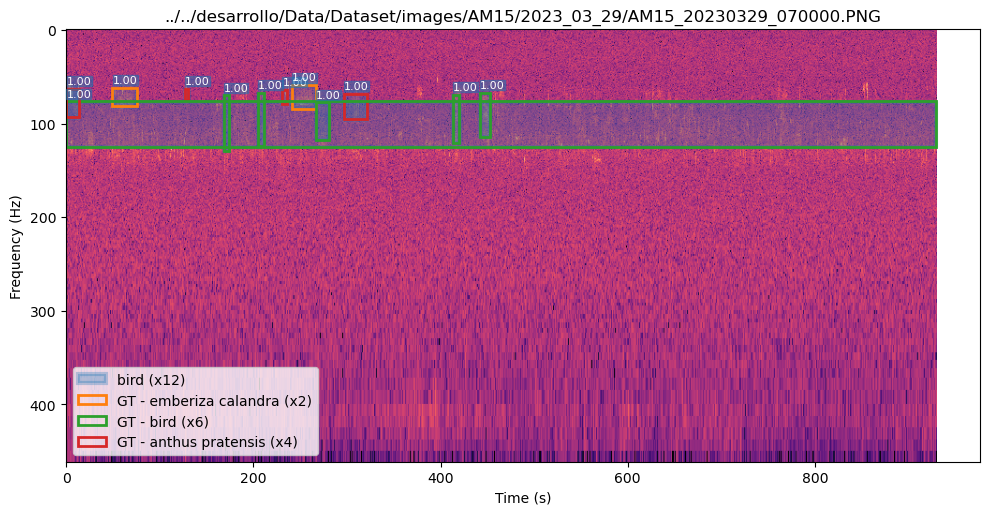

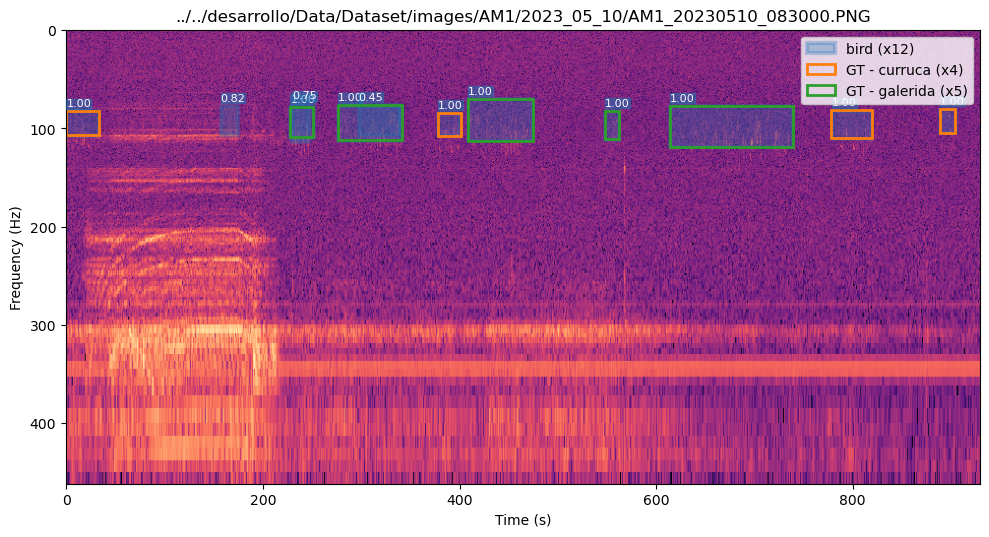

In [71]:
# 10 Best predictions
best_predictions = sorted(predictions, key=lambda x: x['score'], reverse=True)[:10]
best_images = list(set([pred['image_id'] for pred in best_predictions]))
for image_path in best_images:
    # Look in image path for the whole path
    image_path = [path for path in image_paths if image_path in path][0]
    plot_image_and_bboxes(image_path)